# Adel Movahedian & Mehdi zolfaghari

### 1.Data Preprocessing

There are many ways to load MNIST , for this particular task I preferred to load it from Scikit-learn datasets.

data shape: (70000, 784)


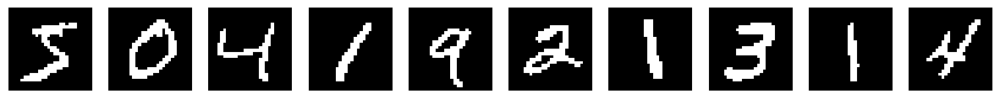

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import fetch_openml

def preprocessData(threshold=127):
    mnist = fetch_openml('mnist_784', version=1)
    data = (mnist.data > threshold).astype(np.float32)
    return data.values, mnist.target

def visualizeBinaryData(data, n_samples=10):
    fig, axes = plt.subplots(1, n_samples, figsize=(15, 3))
    for i in range(n_samples):
        axes[i].imshow(data[i].reshape(28, 28), cmap='gray')
        axes[i].axis('off')
    plt.show()
data, labels = preprocessData()
print("data shape:", data.shape)
visualizeBinaryData(data)


### 2. Algorithm Implementation and Learning

In below section we try to implement.


Training RBM with k = 1
Epoch 1/10, Reconstruction Error: 0.1170
Epoch 2/10, Reconstruction Error: 0.0988
Epoch 3/10, Reconstruction Error: 0.0975
Epoch 4/10, Reconstruction Error: 0.0978
Epoch 5/10, Reconstruction Error: 0.0980
Epoch 6/10, Reconstruction Error: 0.0981
Epoch 7/10, Reconstruction Error: 0.0981
Epoch 8/10, Reconstruction Error: 0.0980
Epoch 9/10, Reconstruction Error: 0.0981
Epoch 10/10, Reconstruction Error: 0.0985


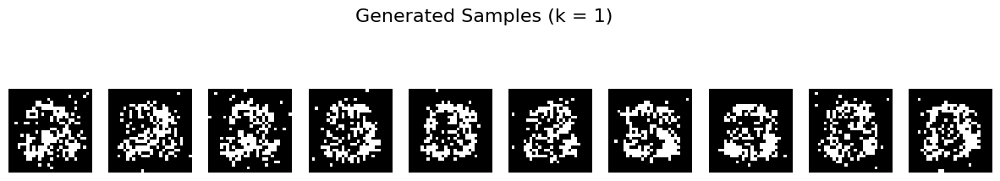


Training RBM with k = 5
Epoch 1/10, Reconstruction Error: 0.1046
Epoch 2/10, Reconstruction Error: 0.0782
Epoch 3/10, Reconstruction Error: 0.0710
Epoch 4/10, Reconstruction Error: 0.0666
Epoch 5/10, Reconstruction Error: 0.0634
Epoch 6/10, Reconstruction Error: 0.0611
Epoch 7/10, Reconstruction Error: 0.0591
Epoch 8/10, Reconstruction Error: 0.0575
Epoch 9/10, Reconstruction Error: 0.0563
Epoch 10/10, Reconstruction Error: 0.0552


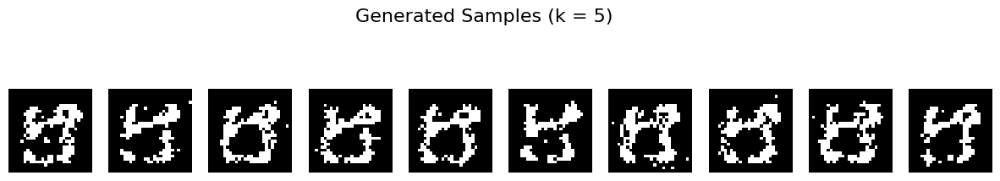


Training RBM with k = 10
Epoch 1/10, Reconstruction Error: 0.1138
Epoch 2/10, Reconstruction Error: 0.0875
Epoch 3/10, Reconstruction Error: 0.0802
Epoch 4/10, Reconstruction Error: 0.0756
Epoch 5/10, Reconstruction Error: 0.0724
Epoch 6/10, Reconstruction Error: 0.0699
Epoch 7/10, Reconstruction Error: 0.0679
Epoch 8/10, Reconstruction Error: 0.0664
Epoch 9/10, Reconstruction Error: 0.0650
Epoch 10/10, Reconstruction Error: 0.0637


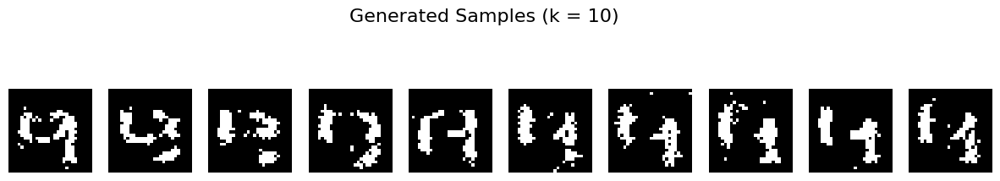

In [ ]:
from scipy.special import expit #stable sigmoid that wont overflow
class RBM:
    def __init__(self, n_visible, n_hidden, learning_rate=0.001):
        self.n_visible = n_visible
        self.n_hidden = n_hidden
        self.learning_rate = learning_rate
        # We initialize weights and biases below
        self.weights = np.random.normal(0, np.sqrt(2 / (n_visible + n_hidden)), (n_hidden, n_visible)) # Xavier Initialization
        self.h_bias = np.zeros(n_hidden)  # Hidden_layer bias
        self.v_bias = np.zeros(n_visible)  # Visible_layer bias

    def sigmoid(self, x):
        return expit(x)

    def sample_prob(self, probs):
        return (np.random.rand(*probs.shape) < probs).astype(np.float32)

    def train(self, data, epochs=10, k=1):
        for epoch in range(epochs):
            epoch_error = 0
            for sample in data:
                #positive phase:
                v0 = sample
                h0_prob = self.sigmoid(np.dot(self.weights, v0) + self.h_bias)
                h0 = self.sample_prob(h0_prob)  # Optional sampling

                #negative phase (Gibbs sampling):
                vk = v0
                for _ in range(k):
                    hk_prob = self.sigmoid(np.dot(self.weights, vk) + self.h_bias)
                    hk = self.sample_prob(hk_prob)
                    vk_prob = self.sigmoid(np.dot(self.weights.T, hk) + self.v_bias)
                    vk = self.sample_prob(vk_prob)

                #compute weight and bias updates below
                positive_grad = np.outer(h0_prob, v0)
                negative_grad = np.outer(hk_prob, vk)
                self.weights += self.learning_rate * (positive_grad - negative_grad)
                self.h_bias += self.learning_rate * (h0_prob - hk_prob)
                self.v_bias += self.learning_rate * (v0 - vk)

                #compute reconstruction error below
                epoch_error += np.mean((v0 - vk) ** 2)

            print(f"Epoch {epoch + 1}/{epochs}, Reconstruction Error: {epoch_error / len(data):.4f}")

    def reconstruct(self, v):
        h_prob = self.sigmoid(np.dot(self.weights, v) + self.h_bias)
        h = self.sample_prob(h_prob)
        v_reconstructed = self.sigmoid(np.dot(self.weights.T, h) + self.v_bias)
        return v_reconstructed

    def generate_samples(self, n_samples=10, steps=100):
        samples = []
        self.sample_trajectory = []  # Store trajectories for animation
        v = np.random.rand(self.n_visible)  # Random visible vector
        for _ in range(n_samples):
            trajectory = []
            for _ in range(steps):  # Gibbs sampling
                h_prob = self.sigmoid(np.dot(self.weights, v) + self.h_bias)
                h = self.sample_prob(h_prob)
                v_prob = self.sigmoid(np.dot(self.weights.T, h) + self.v_bias)
                v = self.sample_prob(v_prob)
                trajectory.append(v.copy())  # Save intermediate steps
            self.sample_trajectory.append(trajectory)
            samples.append(v)
        return np.array(samples)
n_visible = 784
n_hidden = 256
learning_rate = 0.001
epochs = 10
ks = [1,5,10]
all_errors = {}
for k in ks:
  print(f"\nTraining RBM with k = {k}")
  rbm = RBM(n_visible, n_hidden, learning_rate)
  reconstruction_errors = rbm.train(data, epochs, k)
  all_errors[k] = reconstruction_errors
  generated_samples = rbm.generate_samples(n_samples=10)
  fig, axes = plt.subplots(1, 10, figsize=(15, 3))
  for i, sample in enumerate(generated_samples):
      axes[i].imshow(sample.reshape(28, 28), cmap='gray')
      axes[i].axis('off')
  plt.suptitle(f"Generated Samples (k = {k})", fontsize=16)
  plt.show()

A little try to make model more complex:(5 hour run time)


Training RBM with k = 20
Epoch 1/20, Reconstruction Error: 0.1161
Epoch 2/20, Reconstruction Error: 0.0911
Epoch 3/20, Reconstruction Error: 0.0832
Epoch 4/20, Reconstruction Error: 0.0784
Epoch 5/20, Reconstruction Error: 0.0749
Epoch 6/20, Reconstruction Error: 0.0723
Epoch 7/20, Reconstruction Error: 0.0704
Epoch 8/20, Reconstruction Error: 0.0688
Epoch 9/20, Reconstruction Error: 0.0673
Epoch 10/20, Reconstruction Error: 0.0662
Epoch 11/20, Reconstruction Error: 0.0652
Epoch 12/20, Reconstruction Error: 0.0643
Epoch 13/20, Reconstruction Error: 0.0635
Epoch 14/20, Reconstruction Error: 0.0627
Epoch 15/20, Reconstruction Error: 0.0621
Epoch 16/20, Reconstruction Error: 0.0615
Epoch 17/20, Reconstruction Error: 0.0609
Epoch 18/20, Reconstruction Error: 0.0603
Epoch 19/20, Reconstruction Error: 0.0598
Epoch 20/20, Reconstruction Error: 0.0593


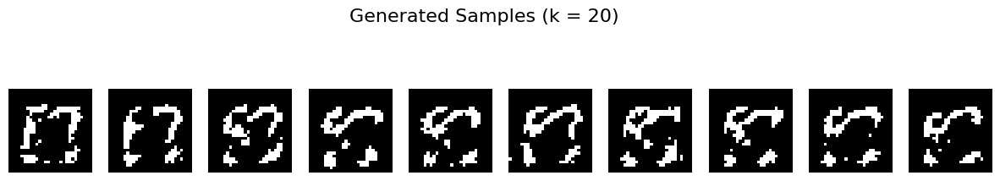

In [ ]:
# a very good model but didn't implement some of these on previous ones due to high cost of computation
n_visible = 784
n_hidden = 512
learning_rate = 0.001
epochs = 20
ks = [20]
all_errors = {}
for k in ks:
  print(f"\nTraining RBM with k = {k}")
  rbm = RBM(n_visible, n_hidden, learning_rate)
  reconstruction_errors = rbm.train(data, epochs, k)
  all_errors[k] = reconstruction_errors
  generated_samples = rbm.generate_samples(n_samples=10)
  fig, axes = plt.subplots(1, 10, figsize=(15, 3))
  for i, sample in enumerate(generated_samples):
      axes[i].imshow(sample.reshape(28, 28), cmap='gray')
      axes[i].axis('off')
  plt.suptitle(f"Generated Samples (k = {k})", fontsize=16)
  plt.show()

through search => k=1 is sufficient for MNIST

### 3.Sample Generation Process Visualization

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, PillowWriter
from IPython.display import HTML

fig, ax = plt.subplots()
im = ax.imshow(rbm.sample_trajectory[0][0].reshape(28, 28), cmap="gray", interpolation="none")
ax.axis("off")
def update(frame):
    sample_idx = frame // len(rbm.sample_trajectory[0])  # Sample index
    step_idx = frame % len(rbm.sample_trajectory[0])  # Step index
    v = rbm.sample_trajectory[sample_idx][step_idx]
    im.set_array(v.reshape(28, 28))
    ax.set_title(f"Sample {sample_idx + 1}, Step {step_idx}")
    return [im]
plt.close(fig)
frames = len(rbm.sample_trajectory) * len(rbm.sample_trajectory[0])
ani = FuncAnimation(fig, update, frames=frames, interval=200, blit=True)
ani.save("k=10_rbm_animation.gif", writer=PillowWriter(fps=10))
HTML(ani.to_jshtml())
#one time generated a gif for complex model and one time for the model that has the best visual reconstruction

### 4. Control Over Generated Samples

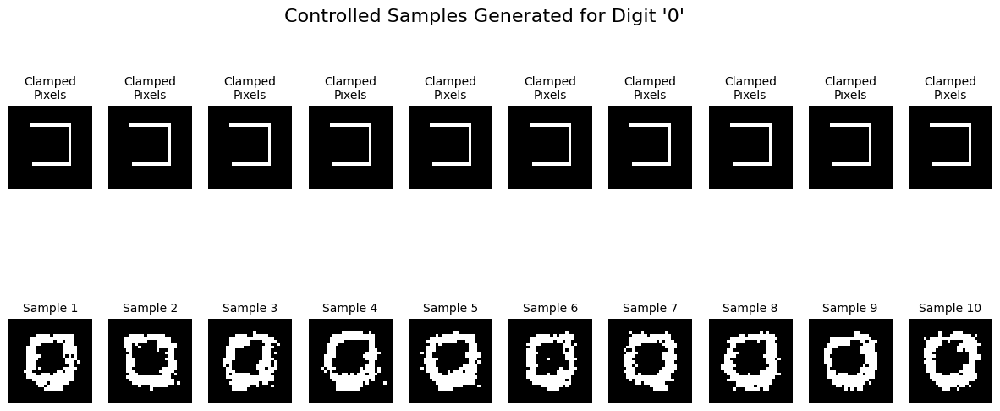

In [ ]:
#clamping parameters to generate a digit resembling '0'
#pixel indices corresponding to a circular structure of '0'
clamp_indices = [175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188
                 , 216, 244, 272, 300, 328, 356, 384, 412, 440, 468, 496,524,552,
                 551,550,549,548,547,546,545,544,543,542,541,540]


# Assuming the indices are 1D positions in an array
clamp_indices = np.array(clamp_indices)

# Compute the center of the original set of indices
center = np.mean(clamp_indices)

# Scale the distance from the center by a factor (e.g., factor=1.5 for a larger circle)
factor = 1
clamp_indices1 = np.round(center + (clamp_indices - center) * factor).astype(int)
 # indices for circular structure

clamp_values = [1] * len(clamp_indices1)  # Clamp these indices to '1'

# Generate controlled samples for '0'
controlled_samples = rbm.generate_controlled_samples(
    n_samples=10, steps=100, clamp_indices=clamp_indices1, clamp_values=clamp_values
)

# controlled samples
fig, axes = plt.subplots(2, 10, figsize=(15, 6))

for i, sample in enumerate(controlled_samples):
    #original clamped pixels
    clamped_image = np.zeros(rbm.n_visible)
    clamped_image[clamp_indices1] = clamp_values

    #clamped image
    axes[0, i].imshow(clamped_image.reshape(28, 28), cmap='gray')
    axes[0, i].axis('off')
    axes[0, i].set_title(f"Clamped\nPixels", fontsize=10)

    #generated sample
    axes[1, i].imshow(sample.reshape(28, 28), cmap='gray')
    axes[1, i].axis('off')
    axes[1, i].set_title(f"Sample {i+1}", fontsize=10)

plt.suptitle("Controlled Samples Generated for Digit '0'", fontsize=16)
plt.show()


what I tried to do is basically showing ,incomplete pattern of what we wnt to generate and then the model will see what number mostly matches the pattern and as you can see the model generated good-shaped zeros of my own patterns.So we can conclude this approach actually works to generate very good samples. I also tried it with different patterns and the result for other numbers was very promising too.